In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import folium
import numpy as np

from IPython.display import display, HTML
#display(HTML("<style>.container {width:100% !important;}</style>"))

In [2]:
garagens = gpd.read_file('Garagens_de_operadores_do_Serviço_Público_de_Transporte_Coletivo_de_Passageiros_por_Ônibus_(SPPO)_no_Município_do_Rio_de_Janeiro_em_2021_2022-07-09-09-27-23.geojson')
garagens

,fid,operador,endereco,bairro,globalid,shape__Area,shape__Length,geometry
0,1,Rodoviária A. Matias,"Rua Doutor Bulhões, 766",Engenho de Dentro,487f632a-d751-4a99-ac5c-601aa4fc6c65,11857.516602,565.686811,"POLYGON ((-43.29968 -22.90235, -43.29953 -22.9..."
1,2,Expresso Recreio,"Estrada Rio do A, 1500",Campo Grande,5f4327ba-d756-4a1a-a30a-0824159b5e0d,49440.964844,1075.244637,"POLYGON ((-43.56033 -22.89690, -43.56104 -22.8..."
2,3,BRT Rio,"Rua Barreiros, 21",Ramos,b4018fc5-f38b-42a4-8529-acf66618d842,12902.643555,475.996946,"POLYGON ((-43.25234 -22.85452, -43.25232 -22.8..."
3,4,Auto Viação Tijuca,"Estrada dos Bandeirantes, 5900",Curicica,6b164adc-07d5-48c7-85fc-5b75d2e320b4,32569.469727,907.985654,"POLYGON ((-43.39606 -22.96136, -43.39617 -22.9..."
4,5,Transportes Barra,"Rua General Canrobert Pereira da Costa, 536",Magalhães Bastos,c38355cb-e86e-443a-8938-053b67da2376,24602.004883,682.468414,"POLYGON ((-43.42063 -22.87614, -43.42017 -22.8..."
5,6,Viação Vila Real,"Rua Saravatá, 210",Marechal Hermes,0cec1713-13c8-421f-87b8-4a3a0e8fefa7,30811.953125,1018.732133,"POLYGON ((-43.37181 -22.85692, -43.37102 -22.8..."
6,7,Viação Novacap,"Avenida Jambeiro, 9",Marechal Hermes,3c036646-9683-49c5-8800-436e3e3e0ae3,4681.967773,310.060900,"POLYGON ((-43.36907 -22.87766, -43.36917 -22.8..."
7,8,GIRE Transportes,"Avenida Itaoca, 362",Bonsucesso,52a2f2fe-3033-4bc1-8337-de0e90b458bb,5862.266602,334.667388,"POLYGON ((-43.25906 -22.86737, -43.25895 -22.8..."
8,9,Viação Nossa Senhora das Graças; Viação Verdun,"Rua Leopoldo, 708",Andaraí,d1933499-3e59-4831-8063-1f1d2bf22c81,16761.634766,721.958519,"POLYGON ((-43.25362 -22.92994, -43.25440 -22.9..."
9,10,Real Auto Ônibus,"Avenida Brasil, 4200",Maré,63444707-df53-442e-a13c-ac53cd3f9864,54025.920898,947.517567,"POLYGON ((-43.24177 -22.87353, -43.24173 -22.8..."


In [3]:
itinerarios = gpd.read_file('Itinerários_de_Serviços_de_Ônibus_Urbanos_Regulares_2022-07-09-09-27-23.geojson')
itinerarios

,fid,servico,destino,consorcio,SHAPE__Length,geometry
0,1,006,Castelo,Intersul,9154.821469,"LINESTRING (-43.20780 -22.94566, -43.20789 -22..."
1,2,006,Silvestre,Intersul,9635.133534,"LINESTRING (-43.17484 -22.90895, -43.17593 -22..."
2,3,006 SN,Silvestre,Intersul,16256.436708,"LINESTRING (-43.17484 -22.90895, -43.17593 -22..."
3,4,007,Central,Intersul,9131.921000,"LINESTRING (-43.20780 -22.94566, -43.20789 -22..."
4,5,007,Silvestre,Intersul,10003.052193,"LINESTRING (-43.19090 -22.90310, -43.19095 -22..."
...,...,...,...,...,...,...
740,741,913,Del Castilho,Internorte,10339.555586,"LINESTRING (-43.23963 -22.83937, -43.23917 -22..."
741,742,810,Pontal,Transcarioca,28984.748797,"LINESTRING (-43.37423 -22.92340, -43.37421 -22..."
742,743,810,Taquara,Transcarioca,29217.745933,"LINESTRING (-43.51618 -23.01613, -43.51682 -23..."
743,744,386 SN,Candelária,Internorte,41816.105119,"LINESTRING (-43.40598 -22.82630, -43.40562 -22..."


In [4]:
pontos_parada = pd.read_csv('pontos_parada_data_rio_2022-07-09-09-27-23.csv')
pontos_parada = pontos_parada[pontos_parada.Modal == 'SPPO']
pontos_parada

,Unnamed: 0,stop_name,stop_id,stop_desc,stop_lat,stop_lon,location_type,Modal,Corredor,Tipo de parada,...,Endereço,MultiModal,id_sequencial,NumeroLinha,Vista,Horários,Existe o ponto?,parent_station,nome_ponto,route_type
0,0,Rua Sacadura Cabral 68,1001O00005C0,NaN,-22.897510,-43.183560,0,SPPO,Não se aplica,Ponto convencional,...,Rua Sacadura Cabral 68,22,5,NÃO,NÃO,NÃO,NÃO,NaN,NaN,3.0
1,1,"Avenida Barão de Tefé, oposto ao 99",1001O00006C0,NaN,-22.897310,-43.187370,0,SPPO,Não se aplica,Ponto convencional,...,AVENIDA BARAO DE TEFE 107,22,6,NÃO,NÃO,NÃO,SIM,NaN,"Avenida Barão de Tefé, oposto ao 99",3.0
2,2,"Avenida Venezuela , 153",1001O00008C0,NaN,-22.895900,-43.186380,0,SPPO,Não se aplica,Ponto convencional,...,"Avenida Venezuela , 153",22,8,NÃO,NÃO,NÃO,SIM,NaN,NaN,3.0
3,3,Barão de Tefé,1001O00010C1,NaN,-22.897488,-43.186627,0,SPPO,Não se aplica,Ponto convencional,...,R. Sacadura Cabral,22,10,NÃO,NÃO,NÃO,SIM,NaN,Barão de Tefé,3.0
11,11,"Rua Rivadávia Corrêa , 187",1002O00001C0,NaN,-22.897970,-43.195400,0,SPPO,Não se aplica,Ponto convencional,...,Rua Rivadávia Corrêa próximo ao 111-139,22,1,NÃO,NÃO,NÃO,SIM,NaN,"Rua Rivadávia Corrêa , 187",3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8782,8782,"Av. Brasil, 34939.",5162O00022C0,NaN,-22.855105,-43.487509,0,SPPO,Não se aplica,Ponto convencional,...,Avenida Brasil próximo ao 807 - Bangu,22,22,NÃO,NÃO,NÃO,SIM,NaN,"Av. Brasil, 34939.",3.0
8783,8783,Estrada do Quafa próximo ao 448,5162O00023C9,NaN,-22.853586,-43.487932,0,SPPO,Não se aplica,Ponto convencional,...,Estrada do Quafa próximo ao 448 - Bangu,22,23,NÃO,NÃO,NÃO,SIM,NaN,Estrada do Quafa próximo ao 448,3.0
8784,8784,"Av. Santa Cruz, 7388.",5163O00001C9,NaN,-22.883206,-43.491003,0,SPPO,Não se aplica,Ponto convencional,...,Avenida de Santa Cruz próximo ao 7454 - Senado...,22,1,NÃO,NÃO,NÃO,SIM,NaN,"Av. Santa Cruz, 7388.",3.0
8785,8785,"Av. Santa Cruz, 7938.",5163O00002C9,NaN,-22.882390,-43.495660,0,SPPO,Não se aplica,Ponto convencional,...,Avenida de Santa Cruz próximo ao 7956,22,2,NÃO,NÃO,NÃO,SIM,NaN,"Av. Santa Cruz, 7938.",3.0


In [5]:
pontos_parada['MultiModal'].value_counts()

22          7539
22,40        136
22,40,41       9
22,41,40       6
22,41          5
40,22          5
30             1
30,22          1
22,23          1
22,30          1
Name: MultiModal, dtype: int64

In [6]:
pontos_parada['Tipo de parada'].value_counts()

Ponto convencional        7335
Ponto seletivado           278
Plataforma de Terminal      72
Terminal                    19
Name: Tipo de parada, dtype: int64

In [7]:
pontos_parada['Existe o ponto?'].value_counts()

SIM    7183
NÃO     474
Name: Existe o ponto?, dtype: int64

In [8]:
gpsdata = pd.read_sql("SELECT * FROM gpsdata;", sqlite3.connect('G1-2022-03-23.db'))
gpsdata

,DATE,BUSID,LINE,LATITUDE,LONGITUDE,VELOCITY
0,03-23-2022 03:29:58,A41274,110.0,-22.87498,-43.24185,3.0
1,03-23-2022 05:53:23,D13229,803.0,-22.88376,-43.40751,13.0
2,03-23-2022 22:51:29,A27684,548.0,-22.92030,-43.25637,0.0
3,03-23-2022 06:28:13,C12018,2303.0,-22.93741,-43.65529,0.0
4,03-23-2022 14:59:12,C47823,692.0,-22.93891,-43.33691,0.0
...,...,...,...,...,...,...
352031,03-23-2022 03:40:08,C44583,712.0,-22.86526,-43.35654,0.0
352032,03-23-2022 13:34:38,A50009,645.0,-23.00159,-43.36511,0.0
352033,03-23-2022 20:41:48,C47770,550.0,-22.95164,-43.34888,0.0
352034,03-23-2022 10:29:59,C44654,638.0,-22.86271,-43.36589,0.0


CPU times: user 846 ms, sys: 156 ms, total: 1 s
Wall time: 816 ms


<AxesSubplot:>

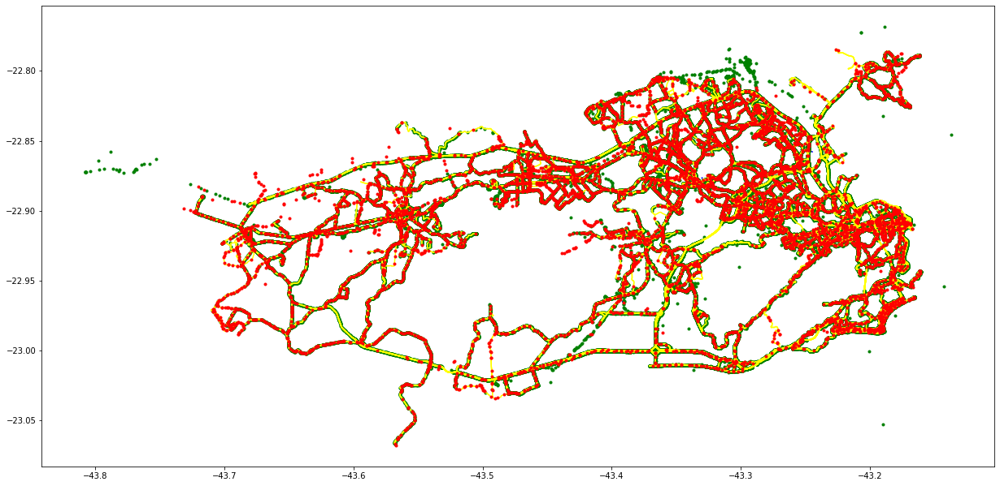

In [9]:
%%time

plt.figure(figsize=(21,13))
ax = plt.gca()
plt.plot(gpsdata.LONGITUDE, gpsdata.LATITUDE, '.', color='green')
itinerarios.plot(ax=ax, color='yellow')
plt.plot(pontos_parada.stop_lon, pontos_parada.stop_lat, '.', color='red')
garagens.plot(ax=ax, color='blue')

In [10]:
%%time

inter_map = folium.Map(location=[garagens.geometry.values[0].centroid.y,garagens.geometry.values[0].centroid.x], zoom_start=12)

garagens_group = folium.FeatureGroup(name="Garagens")
garagens_group.add_to(inter_map)

for _, i in garagens.iterrows():
    label = ' / '.join(i[['operador', 'endereco', 'bairro']])

    folium.Polygon(
        np.array(i.geometry.boundary.coords)[:,::-1],
        fill = True,
        popup = label,
    ).add_to(garagens_group)
    
    folium.Marker(
        [i.geometry.centroid.y, i.geometry.centroid.x],
        popup = label,
    ).add_to(garagens_group)


# itinerarios_group = folium.FeatureGroup(name="Itinerários")
# itinerarios_group.add_to(inter_map)

# for _, i in itinerarios.iterrows():
#     folium.PolyLine(
#         np.array(i.geometry.coords)[:,::-1],
#         color = 'yellow',
#         popup = ' / '.join(i[['servico', 'destino', 'consorcio']]),
#     ).add_to(itinerarios_group)



pontos_parada_group = folium.FeatureGroup(name="Pontos de Parada")
pontos_parada_group.add_to(inter_map)

for _, i in pontos_parada.iterrows():
    folium.CircleMarker(
        [i.stop_lat, i.stop_lon], 
        popup = i['stop_name'],
        color = 'red',
        fill=True,
        radius = 2,
    ).add_to(pontos_parada_group)

folium.LayerControl().add_to(inter_map)
inter_map

CPU times: user 698 ms, sys: 32.5 ms, total: 730 ms
Wall time: 729 ms


In [11]:
print('total e percentual de registros "parados":', (gpsdata.VELOCITY == 0).sum(), (gpsdata.VELOCITY == 0).mean())

total e percentual de registros "parados": 181037 0.5142570646183913


In [12]:
%%time

gpsdata_points = gpd.GeoSeries(gpd.points_from_xy(gpsdata.LONGITUDE, gpsdata.LATITUDE))
in_garage = np.array([gpsdata_points.within(i) for i in garagens.geometry])

CPU times: user 25.4 s, sys: 50.8 ms, total: 25.4 s
Wall time: 25.4 s


In [13]:
in_garage.shape

(37, 352036)

In [14]:
print('pontos em mais de uma garagem:', (in_garage.sum(0) > 1).sum())

pontos em mais de uma garagem: 0


In [15]:
print('total e percentual em garagem:', (in_garage.sum(0) > 0).sum(), (in_garage.sum(0) > 0).mean())

total e percentual em garagem: 78161 0.2220255882921065


In [16]:
print('total em cada garagem')
np.sort(in_garage.sum(1))

total em cada garagem


array([    0,     0,     0,     0,     0,    16,    18,    30,    34,
          96,   244,   283,   311,   394,   481,   510,   519,   661,
         865,   906,  1067,  1181,  1236,  1348,  1866,  2052,  2183,
        2550,  2605,  2837,  3220,  3371,  4896,  5017,  6499,  7692,
       23173])

In [17]:
garagens.loc[in_garage.sum(1).argsort()]

,fid,operador,endereco,bairro,globalid,shape__Area,shape__Length,geometry
26,27,Transportes Barra,"Estrada da Posse, 1670",Campo Grande,1929f6b1-74d5-44b6-9e71-328c4b6de386,13685.108398,574.674628,"POLYGON ((-43.55307 -22.88299, -43.55280 -22.8..."
2,3,BRT Rio,"Rua Barreiros, 21",Ramos,b4018fc5-f38b-42a4-8529-acf66618d842,12902.643555,475.996946,"POLYGON ((-43.25234 -22.85452, -43.25232 -22.8..."
25,26,Viação Acari,"Rua Miguel Rangel, 493",Madureira,1899a524-bcc6-4b75-bf2e-8a911d19a098,17628.322266,527.072613,"POLYGON ((-43.33063 -22.87615, -43.32968 -22.8..."
22,23,Real Auto Ônibus,"Rua Vinte e Nove de Julho, 357",Maré,d966faff-dd6b-4d09-95fe-f0ccb24712f5,14816.834961,500.713519,"POLYGON ((-43.24527 -22.85813, -43.24539 -22.8..."
30,31,BRT Rio,"Rua Leonardo Villas Boas, lotes 4, 5 e 6.",Jacarepaguá,7dba92d8-19fc-4aef-b7a5-f40d230d83da,18406.614258,567.780286,"POLYGON ((-43.39234 -22.96432, -43.39156 -22.9..."
17,18,Transportes Paranapuan,"Estrada do Galeão, 178",Cacuia,39726afe-08bd-4440-afc2-e5f0c81e46fa,24257.089844,697.195889,"POLYGON ((-43.18827 -22.81469, -43.18754 -22.8..."
32,33,Transurb,"Rua José dos Reis, 1136",Engenho de Dentro,c1f80529-2b9a-4c8d-a72e-94355601030c,53871.330078,991.943251,"POLYGON ((-43.29102 -22.88849, -43.29144 -22.8..."
19,20,Auto Viação Tijuca,"Rua Leopoldo, 610",Andaraí,c39f5045-ea73-4233-bf37-3cea61467475,14703.331055,678.194617,"POLYGON ((-43.25353 -22.92984, -43.25418 -22.9..."
3,4,Auto Viação Tijuca,"Estrada dos Bandeirantes, 5900",Curicica,6b164adc-07d5-48c7-85fc-5b75d2e320b4,32569.469727,907.985654,"POLYGON ((-43.39606 -22.96136, -43.39617 -22.9..."
8,9,Viação Nossa Senhora das Graças; Viação Verdun,"Rua Leopoldo, 708",Andaraí,d1933499-3e59-4831-8063-1f1d2bf22c81,16761.634766,721.958519,"POLYGON ((-43.25362 -22.92994, -43.25440 -22.9..."
